In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import statsmodels.api as sm

In [5]:
housing = pd.read_csv('data/housing_cleaned.csv')

In [6]:
housing.corr().style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,sf_dist,la_dist,sd_dist,in_city
longitude,1.000000,-0.924351,-0.108276,0.042748,0.066690,0.099354,0.053759,-0.012840,-0.046072,0.962922,-0.896757,-0.964948,0.211816
latitude,-0.924351,1.000000,0.010390,-0.033854,-0.065945,-0.109511,-0.070792,-0.083817,-0.145969,-0.898497,0.935960,0.986755,-0.430895
housing_median_age,-0.108276,0.010390,1.000000,-0.362996,-0.321306,-0.297229,-0.303841,-0.151717,0.108948,-0.105957,-0.026309,0.042705,0.237361
total_rooms,0.042748,-0.033854,-0.362996,1.000000,0.931935,0.859265,0.920386,0.226167,0.134156,0.032056,-0.014783,-0.037168,0.004842
total_bedrooms,0.066690,-0.065945,-0.321306,0.931935,1.000000,0.878314,0.979900,0.020612,0.066422,0.059075,-0.052869,-0.066659,0.028711
population,0.099354,-0.109511,-0.297229,0.859265,0.878314,1.000000,0.907575,0.031677,-0.014230,0.088757,-0.108955,-0.109784,0.065066
households,0.053759,-0.070792,-0.303841,0.920386,0.979900,0.907575,1.000000,0.044430,0.081689,0.047835,-0.058905,-0.067296,0.065517
median_income,-0.012840,-0.083817,-0.151717,0.226167,0.020612,0.031677,0.044430,1.000000,0.661582,-0.025492,-0.058136,-0.051889,0.276770
median_house_value,-0.046072,-0.145969,0.108948,0.134156,0.066422,-0.014230,0.081689,0.661582,1.000000,-0.040624,-0.118128,-0.079124,0.437561
sf_dist,0.962922,-0.898497,-0.105957,0.032056,0.059075,0.088757,0.047835,-0.025492,-0.040624,1.000000,-0.857288,-0.936327,0.213018


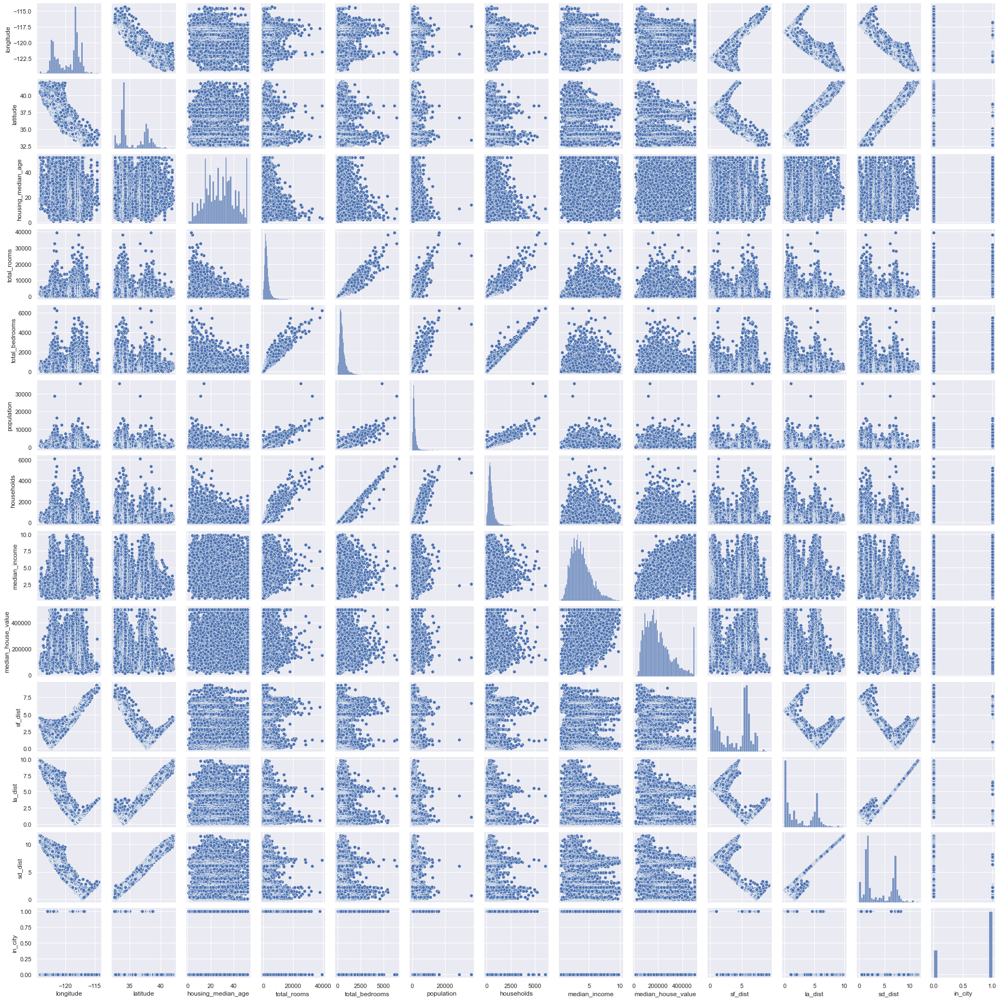

In [7]:
sns.pairplot(housing, height = 2, dropna=True)
plt.show()

## We see almost no correlation between median_house_value except for median income and in city

In [8]:
housing_new = housing.copy()
housing_new['person/room'] = housing_new['population']/housing_new['total_rooms']
housing_new['person/bedroom'] = housing_new['population']/housing_new['total_bedrooms']
housing_new['person/household'] = housing_new['population']/housing_new['total_rooms']

housing_new['room/person'] = housing_new['total_rooms']/housing_new['population']
housing_new['bedroom/person'] = housing_new['total_bedrooms']/housing_new['population']
housing_new['household/person'] = housing_new['total_rooms']/housing_new['population']

#housing_new = housing_new.drop(['population', 'households', total_rooms','total_bedrooms','total_rooms'], axis=1)

In [9]:
housing_new.corr().style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,sf_dist,la_dist,sd_dist,in_city,person/room,person/bedroom,person/household,room/person,bedroom/person,household/person
longitude,1.000000,-0.924351,-0.108276,0.042748,0.066690,0.099354,0.053759,-0.012840,-0.046072,0.962922,-0.896757,-0.964948,0.211816,0.039291,0.020403,0.039291,-0.075263,-0.047105,-0.075263
latitude,-0.924351,1.000000,0.010390,-0.033854,-0.065945,-0.109511,-0.070792,-0.083817,-0.145969,-0.898497,0.935960,0.986755,-0.430895,-0.039359,-0.017708,-0.039359,0.144336,0.108567,0.144336
housing_median_age,-0.108276,0.010390,1.000000,-0.362996,-0.321306,-0.297229,-0.303841,-0.151717,0.108948,-0.105957,-0.026309,0.042705,0.237361,0.044773,0.016925,0.044773,-0.110460,-0.057099,-0.110460
total_rooms,0.042748,-0.033854,-0.362996,1.000000,0.931935,0.859265,0.920386,0.226167,0.134156,0.032056,-0.014783,-0.037168,0.004842,-0.074624,-0.039951,-0.074624,0.128207,0.053254,0.128207
total_bedrooms,0.066690,-0.065945,-0.321306,0.931935,1.000000,0.878314,0.979900,0.020612,0.066422,0.059075,-0.052869,-0.066659,0.028711,-0.043021,-0.049851,-0.043021,0.059998,0.097794,0.059998
population,0.099354,-0.109511,-0.297229,0.859265,0.878314,1.000000,0.907575,0.031677,-0.014230,0.088757,-0.108955,-0.109784,0.065066,0.078996,0.073936,0.078996,-0.137423,-0.134163,-0.137423
households,0.053759,-0.070792,-0.303841,0.920386,0.979900,0.907575,1.000000,0.044430,0.081689,0.047835,-0.058905,-0.067296,0.065517,-0.034420,-0.039208,-0.034420,-0.024682,0.005286,-0.024682
median_income,-0.012840,-0.083817,-0.151717,0.226167,0.020612,0.031677,0.044430,1.000000,0.661582,-0.025492,-0.058136,-0.051889,0.276770,-0.098531,0.008260,-0.098531,0.222657,-0.052377,0.222657
median_house_value,-0.046072,-0.145969,0.108948,0.134156,0.066422,-0.014230,0.081689,0.661582,1.000000,-0.040624,-0.118128,-0.079124,0.437561,-0.083780,-0.038861,-0.083780,0.191688,0.079599,0.191688
sf_dist,0.962922,-0.898497,-0.105957,0.032056,0.059075,0.088757,0.047835,-0.025492,-0.040624,1.000000,-0.857288,-0.936327,0.213018,0.039347,0.019046,0.039347,-0.079389,-0.045610,-0.079389


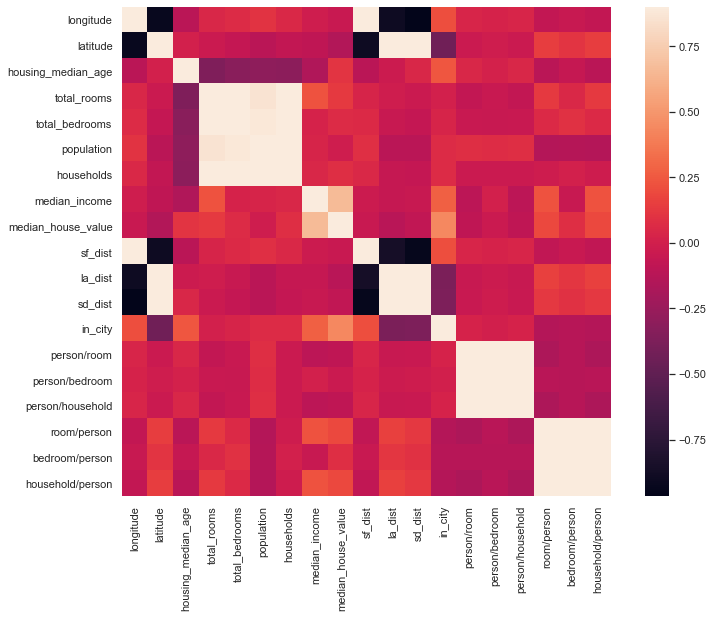

In [10]:
plt.subplots(figsize=(12,9))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

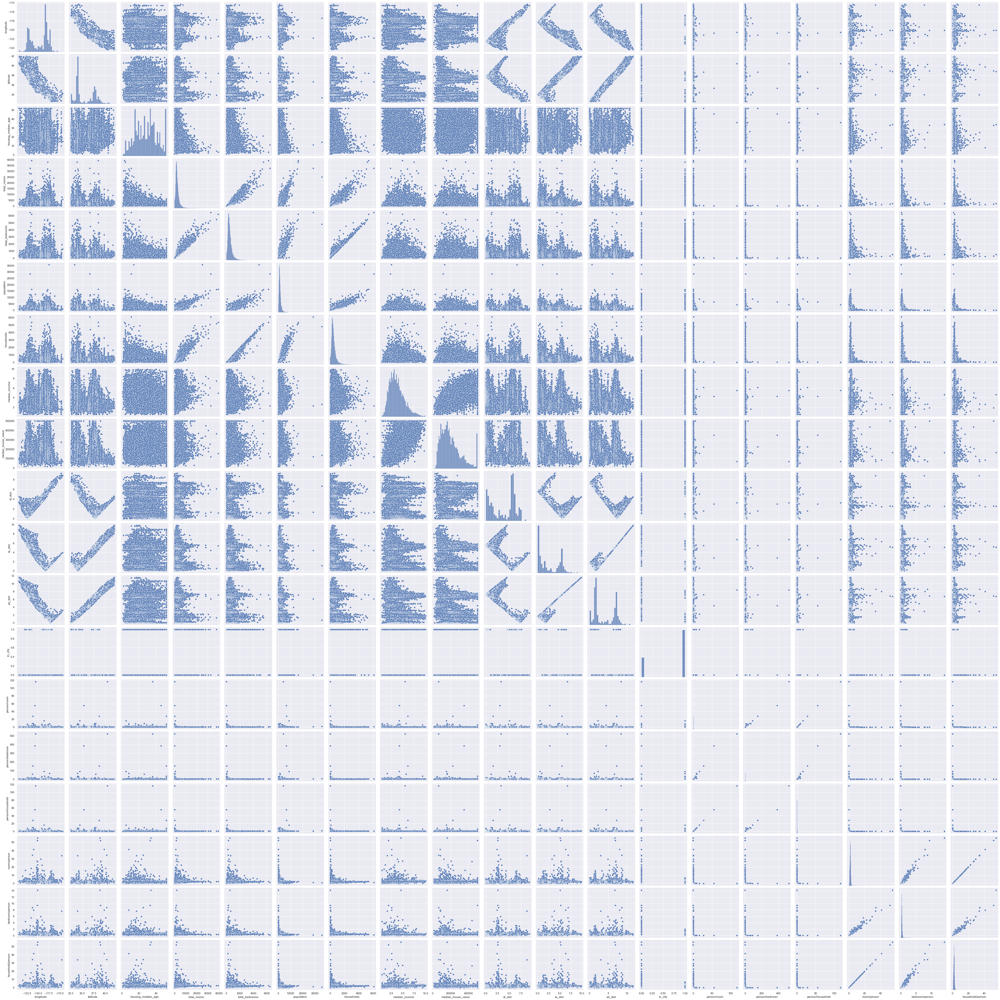

In [11]:
# This plot was saved as an image file and analysed with an image viewer app
sns.pairplot(housing_new, height = 3, dropna=True)
plt.show()

## Applying transfromations to features

transformations to apply to y and x:
log()
sqrt()
square()



In [12]:
for lbd in [['log_',lambda x:np.log(x)], ['sqrt_',lambda x:np.sqrt(x)], ['sqr_',lambda x:np.square(x)]]:
    for feature in ['median_house_value', 'population', 'households', 'total_rooms','total_bedrooms','total_rooms']:
        housing_new[lbd[0]+feature] = housing_new[feature].apply(lbd[1])

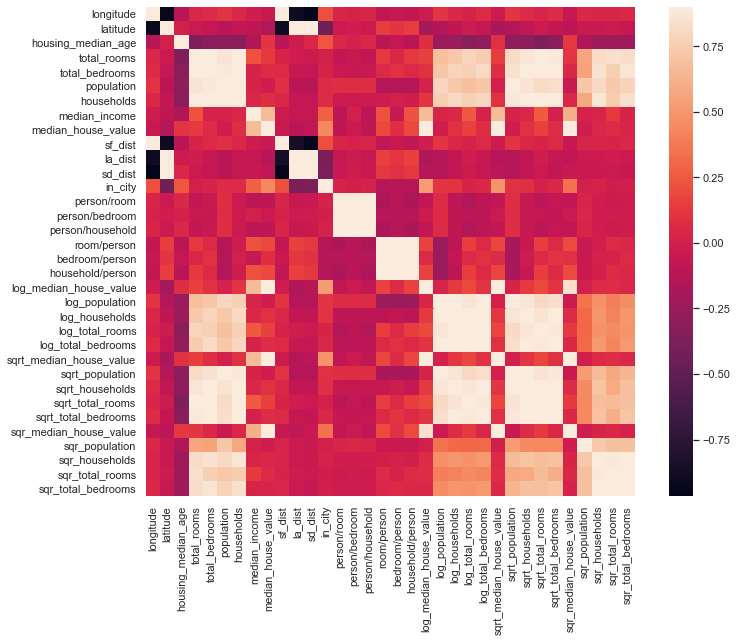

In [13]:
plt.subplots(figsize=(12,9))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

## Applying transformations to engineered features

In [14]:
for lbd in [['log_',lambda x:np.log(x)], ['sqrt_',lambda x:np.sqrt(x)], ['sqr_',lambda x:np.square(x)]]:
    for feature in ['person/room','person/bedroom','person/household','room/person','bedroom/person','household/person','median_income']:
        housing_new[lbd[0]+feature] = housing_new[feature].apply(lbd[1])

In [15]:
hc = list(housing_new.columns)
mhv = ['median_house_value','log_median_house_value','sqrt_median_house_value','sqr_median_house_value']
for i in mhv:
    hc.remove(i)
hc = mhv + hc
housing_new = housing_new[hc]

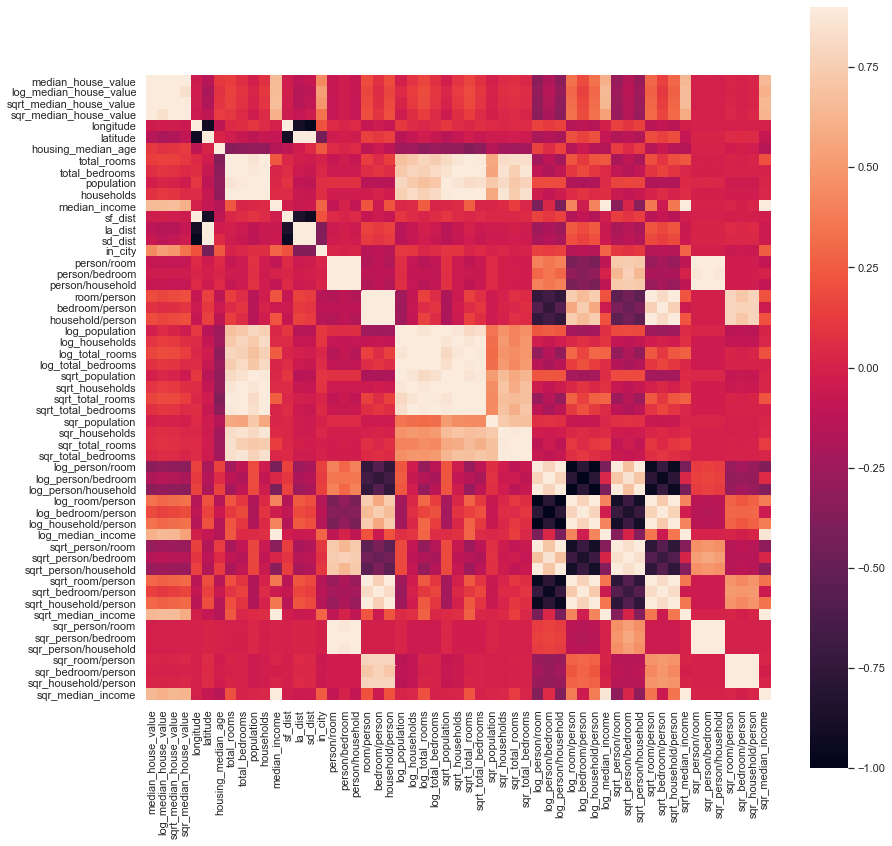

In [16]:
plt.subplots(figsize=(14,14))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

In [17]:
housing_new.dropna().corr().style.background_gradient()

# Geographical features
## Based on the map in part I, it is distance from the city centres are somewhat correlated to the value of a housing block, but not linearly.

In [18]:
"""
# latitude then longitude
# San Francisco: 37.7749° N, -122.4194° W
# Los Angeles 34.0522° N, -118.2437° W


Lambda and function transformation for multiple columns with round. Not necessary at all

sf = (37.7749,-122.4194)
la = (34.0522,-188.2437)

def coord_dist(df, city):
    ecd = np.sqrt((df.latitude-37.7749)**2 + (df.longitude+122.4149)**2)
    return np.round(ecd, 4)

housing['sf_dist'] = housing.apply(lambda x :coord_dist(x[['latitude','longitude']], sf), axis=1)
"""
"""
housing_new['sf_dist'] = np.round(np.sqrt((housing['latitude']-37.7749)**2 + (housing['longitude']+122.4149)**2), 4)
housing_new['la_dist'] = np.round(np.sqrt((housing['latitude']-34.0522)**2 + (housing['longitude']+118.2437)**2), 4)
"""

"\nhousing_new['sf_dist'] = np.round(np.sqrt((housing['latitude']-37.7749)**2 + (housing['longitude']+122.4149)**2), 4)\nhousing_new['la_dist'] = np.round(np.sqrt((housing['latitude']-34.0522)**2 + (housing['longitude']+118.2437)**2), 4)\n"

In [19]:
"""
inefficient lambda -> function -> lambda

def transform(series, lmd):
       return lmd(series)
       
housing['log_sf_dist'] = transform(housing['sf_dist'], lambda x: np.round(np.log(x), 4)
"""
def transform(series, lmd):
       return lmd(series)
    
for lbd in [['log_',lambda x:np.log(x)], ['sqrt_',lambda x:np.sqrt(x)], ['sqr_',lambda x:np.square(x)]]:

    # Lambda at the end is a combination of the loop's lambda and np.round(4)
    housing_new[lbd[0]+'sf_dist'] = transform(housing_new['sf_dist'], lambda x: np.round(lbd[1](x),4))
    housing_new[lbd[0]+'la_dist'] = transform(housing_new['la_dist'], lambda x: np.round(lbd[1](x),4))
    housing_new[lbd[0]+'sd_dist'] = transform(housing_new['sd_dist'], lambda x: np.round(lbd[1](x),4))

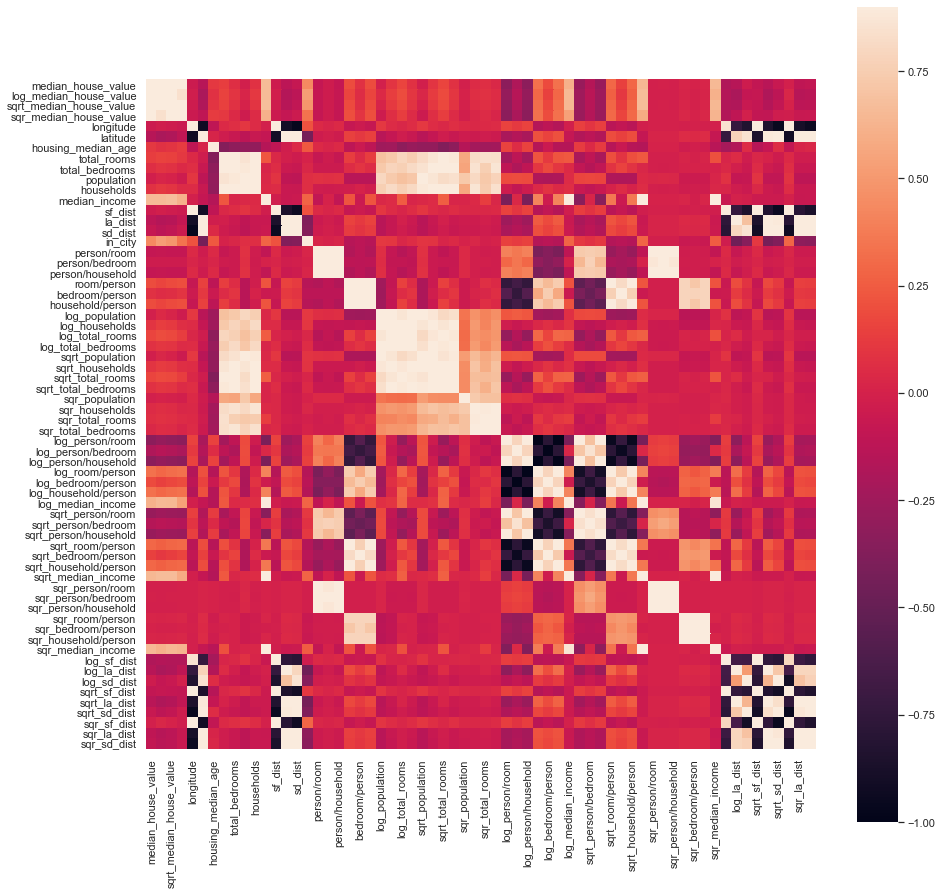

In [20]:
plt.subplots(figsize=(15,15))
sns.heatmap(housing_new.corr(), vmax=0.9, square=True, annot=False)
plt.show()

In [21]:
housing_new.corr().style.background_gradient()

## Testing the product and quotient of other variables

In [22]:
housing_test = housing.copy()
for feature in ['total_bedrooms','total_rooms']:
    housing_test[feature+'/households'] = np.divide(housing_test[feature], housing_test['households'])
    
housing_test['rooms/bedrooms'] = np.divide(housing_test['total_rooms'], housing_test['total_bedrooms'])
housing_test['bedrooms/rooms'] = np.divide(housing_test['total_bedrooms'], housing_test['total_rooms'])

In [23]:
housing_test.corr().style.background_gradient()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,sf_dist,la_dist,sd_dist,in_city,total_bedrooms/households,total_rooms/households,rooms/bedrooms,bedrooms/rooms
longitude,1.000000,-0.924351,-0.108276,0.042748,0.066690,0.099354,0.053759,-0.012840,-0.046072,0.962922,-0.896757,-0.964948,0.211816,0.012413,-0.027476,-0.080632,0.093239
latitude,-0.924351,1.000000,0.010390,-0.033854,-0.065945,-0.109511,-0.070792,-0.083817,-0.145969,-0.898497,0.935960,0.986755,-0.430895,0.070610,0.111066,0.094892,-0.119793
housing_median_age,-0.108276,0.010390,1.000000,-0.362996,-0.321306,-0.297229,-0.303841,-0.151717,0.108948,-0.105957,-0.026309,0.042705,0.237361,-0.076832,-0.156283,-0.175011,0.142198
total_rooms,0.042748,-0.033854,-0.362996,1.000000,0.931935,0.859265,0.920386,0.226167,0.134156,0.032056,-0.014783,-0.037168,0.004842,0.028908,0.132599,0.203215,-0.188534
total_bedrooms,0.066690,-0.065945,-0.321306,0.931935,1.000000,0.878314,0.979900,0.020612,0.066422,0.059075,-0.052869,-0.066659,0.028711,0.044564,0.006099,-0.081834,0.079354
population,0.099354,-0.109511,-0.297229,0.859265,0.878314,1.000000,0.907575,0.031677,-0.014230,0.088757,-0.108955,-0.109784,0.065066,-0.066937,-0.067660,-0.022243,0.030323
households,0.053759,-0.070792,-0.303841,0.920386,0.979900,0.907575,1.000000,0.044430,0.081689,0.047835,-0.058905,-0.067296,0.065517,-0.055771,-0.075881,-0.058857,0.060465
median_income,-0.012840,-0.083817,-0.151717,0.226167,0.020612,0.031677,0.044430,1.000000,0.661582,-0.025492,-0.058136,-0.051889,0.276770,-0.065876,0.303454,0.754281,-0.626249
median_house_value,-0.046072,-0.145969,0.108948,0.134156,0.066422,-0.014230,0.081689,0.661582,1.000000,-0.040624,-0.118128,-0.079124,0.437561,-0.044961,0.118299,0.324550,-0.216142
sf_dist,0.962922,-0.898497,-0.105957,0.032056,0.059075,0.088757,0.047835,-0.025492,-0.040624,1.000000,-0.857288,-0.936327,0.213018,0.004522,-0.041719,-0.093684,0.103676


# Encoding ocean_proximity

In [24]:
housing_new_final = housing_new.iloc[:,:-16]

In [25]:
housing_new_final.columns

Index(['median_house_value', 'log_median_house_value',
       'sqrt_median_house_value', 'sqr_median_house_value', 'longitude',
       'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms',
       'population', 'households', 'median_income', 'ocean_proximity',
       'sf_dist', 'la_dist', 'sd_dist', 'in_city', 'person/room',
       'person/bedroom', 'person/household', 'room/person', 'bedroom/person',
       'household/person', 'log_population', 'log_households',
       'log_total_rooms', 'log_total_bedrooms', 'sqrt_population',
       'sqrt_households', 'sqrt_total_rooms', 'sqrt_total_bedrooms',
       'sqr_population', 'sqr_households', 'sqr_total_rooms',
       'sqr_total_bedrooms', 'log_person/room', 'log_person/bedroom',
       'log_person/household', 'log_room/person', 'log_bedroom/person',
       'log_household/person', 'log_median_income', 'sqrt_person/room',
       'sqrt_person/bedroom', 'sqrt_person/household', 'sqrt_room/person',
       'sqrt_bedroom/person', 'sq

In [26]:
housing_new_final = pd.get_dummies(housing_new_final, drop_first=False)
# k-1 categories out of k categories
# I will decide which one to drop later
housing_new_final.columns

Index(['median_house_value', 'log_median_house_value',
       'sqrt_median_house_value', 'sqr_median_house_value', 'longitude',
       'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms',
       'population', 'households', 'median_income', 'sf_dist', 'la_dist',
       'sd_dist', 'in_city', 'person/room', 'person/bedroom',
       'person/household', 'room/person', 'bedroom/person', 'household/person',
       'log_population', 'log_households', 'log_total_rooms',
       'log_total_bedrooms', 'sqrt_population', 'sqrt_households',
       'sqrt_total_rooms', 'sqrt_total_bedrooms', 'sqr_population',
       'sqr_households', 'sqr_total_rooms', 'sqr_total_bedrooms',
       'log_person/room', 'log_person/bedroom', 'log_person/household',
       'log_room/person', 'log_bedroom/person', 'log_household/person',
       'log_median_income', 'sqrt_person/room', 'sqrt_person/bedroom',
       'sqrt_person/household', 'sqrt_room/person', 'sqrt_bedroom/person',
       'sqrt_household/person

In [27]:
housing_new_final.to_csv('data/housing_processed.csv', index=False)